In [1]:
import warnings
import scanpy as sc
import squidpy as sq
import anndata as an
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import os
import pickle

import time
from tqdm.notebook import tqdm
import requests

sc.settings.set_figure_params(dpi=80)
#sc.set_figure_params(facecolor="white", figsize=(8, 8))
warnings.simplefilter(action='ignore', category=FutureWarning)
sc.settings.verbosity = 3

In [105]:
# load data
#adata_sp = sc.read_h5ad(f'../data/anndata_objects/macaque/macaque_0703.h5ad')
adata_sp = sc.read_h5ad(f'../data/raw_adata/human.h5ad')
adata_sp.obs_names_make_unique()
adata_sp

c:\projects\spatialMPFC\venv\Lib\site-packages\anndata\_core\anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 17633 × 19966
    obs: 'in_tissue', 'array_row', 'array_col', 'label', 'sample_id'
    var: 'gene_ids', 'feature_types'
    uns: 'spatial'
    obsm: 'spatial'

In [106]:
# normalize data
sc.pp.normalize_total(adata_sp, target_sum=1e4)
sc.pp.log1p(adata_sp)

normalizing counts per cell
    finished (0:00:00)


In [75]:
adata_sp.obsm['spatial'][(adata_sp.obs.sample_id == 'human_j3').values].shape

(2925, 2)

In [76]:
adata_sp.obs[adata_sp.obs.sample_id == 'human_j3']

(2925, 5)

In [66]:
adata_sp.obsm['spatial']

array([[ 2960,  1099],
       [ 5663,  1613],
       [ 3290, 11368],
       ...,
       [ 6573, 12790],
       [ 5372, 13141],
       [ 5064, 10528]], dtype=int64)

In [83]:
coord_df = pd.DataFrame(adata_sp.obsm['spatial'], index=adata_sp.obs_names, columns=['x', 'y'])
gene_index = adata_sp.var_names.to_list().index('GFAP')
gene_expr = adata_sp.X.A[:, gene_index]

unique, counts = np.unique(pdist(coord_df.values), return_counts=True)
count_dict = dict(zip(unique, counts))
count_dict

{199.82242116439286: 7,
 200.0: 974,
 200.0024999843752: 1166,
 200.19240744843447: 460,
 200.32473636573192: 15,
 200.6888138387389: 2101,
 201.0: 430,
 201.0024875467963: 512,
 201.06217943710845: 534,
 201.1889659002203: 1924,
 201.55644370746373: 1122,
 346.30766667805665: 115,
 346.4476872487389: 52,
 346.8083043988422: 92,
 346.95388742598055: 4,
 347.17430780517157: 1548,
 347.3110997362451: 2716,
 347.67369759589235: 1266,
 347.81604333325396: 235,
 348.0: 72,
 348.0014367786432: 1356,
 349.0: 79,
 349.0014326618159: 1525,
 400.0012499980469: 1069,
 400.0049999687504: 101,
 401.00124688085447: 1672,
 401.00498750015566: 158,
 401.01122178811903: 31,
 401.5133870744536: 12,
 401.7486776580603: 1790,
 401.8768468075761: 2197,
 402.2449502479801: 983,
 402.3779318004406: 759,
 402.61768465878396: 138,
 403.11288741492746: 80,
 529.7027468307107: 212,
 529.7405025104273: 786,
 530.0283011311755: 2043,
 530.0716932642225: 1310,
 530.0962176812809: 381,
 530.292372187268: 722,
 530.6

In [ ]:
from scipy.spatial.distance import pdist, squareform
from scipy.signal import medfilt2d, wiener

In [107]:
gene_index = adata_sp.var_names.to_list().index('GFAP')
adata_sp.obs['geneexpr1'] = adata_sp.X.A[:, gene_index]

gene_index = adata_sp.var_names.to_list().index('CCK')
adata_sp.obs['geneexpr2'] = adata_sp.X.A[:, gene_index]

In [99]:
df = adata_sp.obs['geneexpr'][(adata_sp.obs.sample_id == 'human_j3')].to_frame().copy()
df[['x', 'y']] = adata_sp.obsm['spatial'][(adata_sp.obs.sample_id == 'human_j3').values]
df

,geneexpr,x,y
AAACAAGTATCTCCCA-1,0.0,12952,11362
AAACACCAATAACTGC-1-2,1.0,4649,12958
AAACAGGGTCTATATT-1-2,1.0,4041,10870
AAACAGTGTTCCTGGG-1-2,1.0,7060,15388
AAACATTTCCCGGATT-1-1,0.0,12458,13280
...,...,...,...
TTGTTGTGTGTCAAGA-1-2,0.0,10438,8062
TTGTTTCACATCCAGG-1-2,0.0,6951,12776
TTGTTTCATTAGTCTA-1-2,0.0,5751,13129
TTGTTTCCATACAACT-1-2,0.0,5441,10517


In [115]:
from scipy.signal import convolve2d

In [126]:
def apply_filter(adata, value_columns, sample_column, method='median', size=3):
    # filter method
    if method == 'median':
        filter_func = medfilt2d
        kwargs = {'kernel_size': size}
    elif method == 'wiener':
        filter_func = wiener
        kwargs = {'mysize': size}
    elif method == 'mean':
        filter_matrix = np.ones((size, size)) / size ** 2
        filter_func = convolve2d
        kwargs = {'in2': filter_matrix, 'mode': 'same'}
    else:
        raise ValueError("Invalid filter method. Choose 'median' or 'wiener'")

    # rotation matrix
    A = 1 / np.sqrt(2) * np.array([[1, -1], [1, 1]])

    # get sample list
    sample_list = adata.obs[sample_column].unique().to_list()
    results_list = list()
    
    for sample in tqdm(sample_list):
        # sub-sample data
        obs_mask = (adata_sp.obs[sample_column] == sample)
        raw_value = adata_sp.obs.loc[obs_mask, value_columns].copy()
        coordinates = adata_sp.obsm['spatial'][obs_mask.values]

        # result df template
        result_df = raw_value.copy()
        result_df.columns = result_df.columns + '_filtered'

        # center data to perform rotation
        x_max, y_max = coordinates.max(axis=0)
        x_min, y_min = coordinates.min(axis=0)

        x_center = x_min + (x_max - x_min) / 2
        y_center = y_min + (y_max - y_min) / 2

        centered_coord = coordinates - np.array([x_center, y_center])

        # rotate data
        rotate_coord = centered_coord @ A

        # convert coordinates to grid coordinates
        floor_divide = np.floor_divide(rotate_coord, 200)
        x_max, y_max = floor_divide.max(axis=0)
        x_min, y_min = floor_divide.min(axis=0)
        real_coord = floor_divide - np.array([x_min, y_min])
        
        # create 2d matrix template for the data
        x = np.arange(0, x_max - x_min + 1)
        y = np.arange(0, y_max - y_min + 1)
        coord = np.array(np.meshgrid(x, y)).T.reshape(-1, 2)

        # create 2d representation of the data
        df = pd.DataFrame(coord, columns=['x', 'y']).set_index(['x', 'y'])
        df[value_columns] = 0
        df.loc[real_coord.tolist(), value_columns] = raw_value.values

        for value in df.columns.to_list():
            X = df.reset_index().pivot(index='x', columns='y', values=value).values
            X_filt = filter_func(X, **kwargs)
            result_df[f'{value}_filtered'] = pd.DataFrame(X_filt).T.unstack().loc[real_coord.tolist()].values
        results_list.append(result_df)
        
    # concat data
    filtered_df = pd.concat(results_list, axis=0)
    adata_sp.obs[filtered_df.columns] = filtered_df

In [129]:
apply_filter(adata_sp, ['geneexpr1', 'geneexpr2'], 'sample_id', method='mean', size=5)

  0%|          | 0/5 [00:00<?, ?it/s]

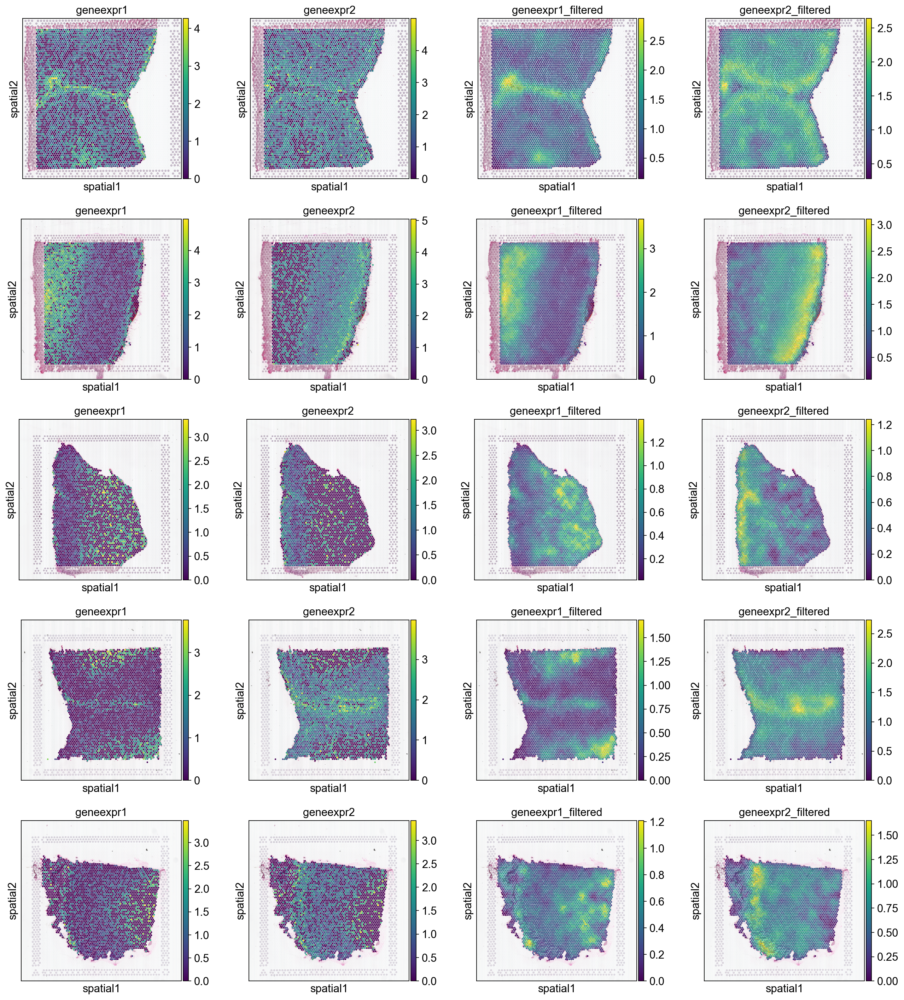

In [130]:
sq.pl.spatial_scatter(adata_sp,
                        color=['geneexpr1', 'geneexpr2', 'geneexpr1_filtered', 'geneexpr2_filtered'],
                        library_key='sample_id', ncols=4, img=True, size=1.3)

In [113]:
apply_filter(adata_sp, ['geneexpr1', 'geneexpr2'], 'sample_id', method='wiener')

  0%|          | 0/5 [00:00<?, ?it/s]

c:\projects\spatialMPFC\venv\Lib\site-packages\scipy\signal\_signaltools.py:1659: RuntimeWarning: divide by zero encountered in divide
  res *= (1 - noise / lVar)
c:\projects\spatialMPFC\venv\Lib\site-packages\scipy\signal\_signaltools.py:1659: RuntimeWarning: invalid value encountered in multiply
  res *= (1 - noise / lVar)
c:\projects\spatialMPFC\venv\Lib\site-packages\scipy\signal\_signaltools.py:1659: RuntimeWarning: divide by zero encountered in divide
  res *= (1 - noise / lVar)
c:\projects\spatialMPFC\venv\Lib\site-packages\scipy\signal\_signaltools.py:1659: RuntimeWarning: invalid value encountered in multiply
  res *= (1 - noise / lVar)
c:\projects\spatialMPFC\venv\Lib\site-packages\scipy\signal\_signaltools.py:1659: RuntimeWarning: divide by zero encountered in divide
  res *= (1 - noise / lVar)
c:\projects\spatialMPFC\venv\Lib\site-packages\scipy\signal\_signaltools.py:1659: RuntimeWarning: invalid value encountered in multiply
  res *= (1 - noise / lVar)
c:\projects\spatial

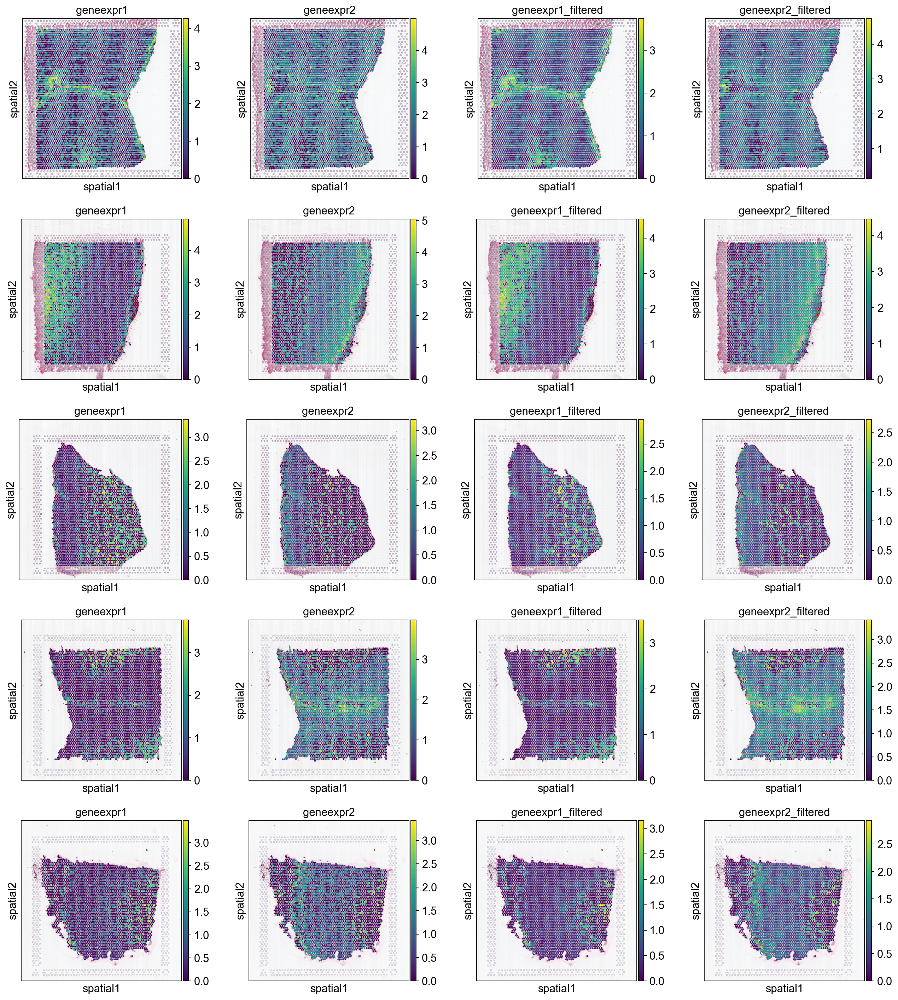

In [114]:
sq.pl.spatial_scatter(adata_sp,
                        color=['geneexpr1', 'geneexpr2', 'geneexpr1_filtered', 'geneexpr2_filtered'],
                        library_key='sample_id', ncols=4, img=True, size=1.3)

In [52]:
coord_df = pd.DataFrame(adata_sp.obsm['spatial'], index=adata_sp.obs_names, columns=['x', 'y'])

 

unique, counts = np.unique(pdist(coord_df.values), return_counts=True)
count_dict = dict(zip(unique, counts))

A = 1 / np.sqrt(2) * np.array([[1, -1], [1, 1]])
x_max, y_max = coord_df.max(axis=0).to_list()
x_min, y_min = coord_df.min(axis=0).to_list()

x_center = x_min + (x_max - x_min) / 2
y_center = y_min + (y_max - y_min) / 2

centered_coord = coord_df.values - np.array([x_center, y_center])
rotate_coord = centered_coord @ A

dev = np.floor_divide(rotate_coord, 200)
x_max, y_max = dev.max(axis=0)
x_min, y_min = dev.min(axis=0)

real_coord = dev - np.array([x_min, y_min])
x = np.arange(0, x_max - x_min + 1)
y = np.arange(0, y_max - y_min + 1)

coord = np.array(np.meshgrid(x, y)).T.reshape(-1, 2)
df = pd.DataFrame(coord, columns=['x', 'y']).set_index(['x', 'y'])
df['values'] = 0
df.loc[real_coord.tolist(), 'values'] = gene_expr.reshape(-1, 1)

X = df.reset_index().pivot(index='x', columns='y', values='values').values
X_filt = medfilt2d(X, kernel_size=3)
X_filt_w = wiener(X)

c:\projects\spatialMPFC\venv\Lib\site-packages\scipy\signal\_signaltools.py:1659: RuntimeWarning: divide by zero encountered in divide
  res *= (1 - noise / lVar)
c:\projects\spatialMPFC\venv\Lib\site-packages\scipy\signal\_signaltools.py:1659: RuntimeWarning: invalid value encountered in multiply
  res *= (1 - noise / lVar)


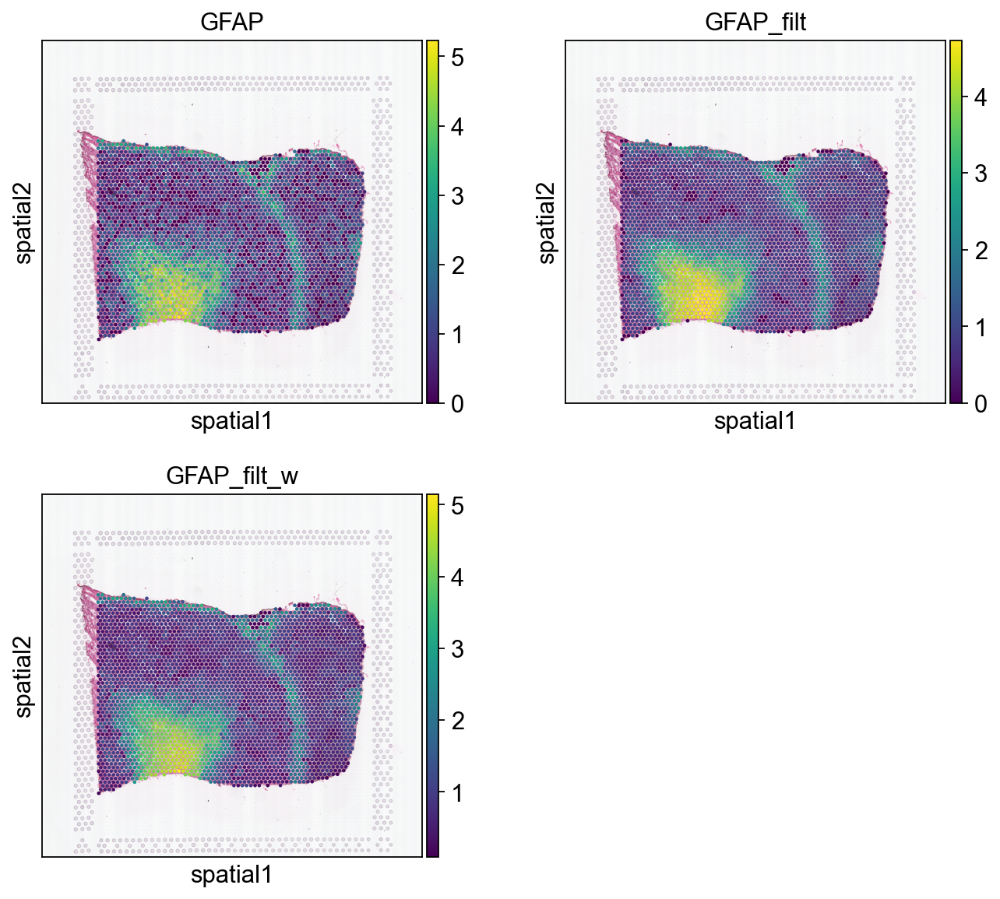

In [53]:
adata_sp.obs['GFAP_filt'] = pd.DataFrame(X_filt).T.unstack().loc[real_coord.tolist()].values
adata_sp.obs['GFAP_filt_w'] = pd.DataFrame(X_filt_w).T.unstack().loc[real_coord.tolist()].values
sq.pl.spatial_scatter(adata_sp,
                        color=['GFAP', 'GFAP_filt', 'GFAP_filt_w'],
                        library_key='sample_id', ncols=2, img=True, size=1.3)

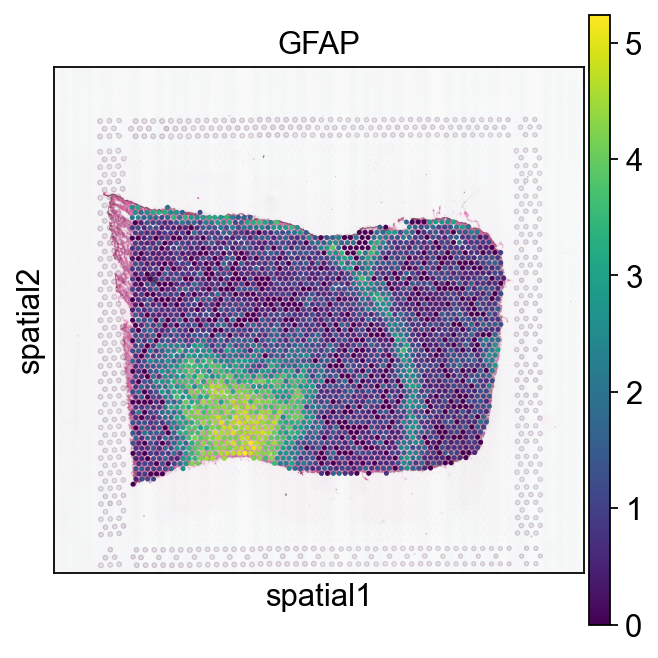

In [4]:
sq.pl.spatial_scatter(adata_sp,
                        color='GFAP',
                        library_key='sample_id', ncols=5, img=True, size=1.3)

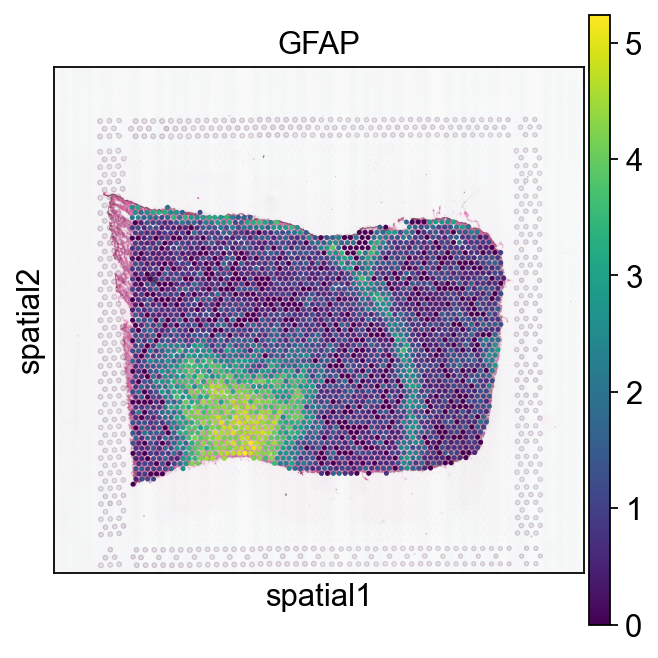

In [5]:
sq.pl.spatial_scatter(adata_sp,
                        color='GFAP',
                        library_key='sample_id', ncols=5, img=True, size=1.3)

In [6]:
coord_df = pd.DataFrame(adata_sp.obsm['spatial'], index=adata_sp.obs_names, columns=['x', 'y'])
coord_df = coord_df.sort_values(['x', 'y'])
coord_df.head()

,x,y
CGTCCAGATGGCTCCA-1,2659,4777
TCGCACTAACGTTTGT-1,2660,5126
TAGAAACACAATAGTG-1,2661,5474
GCGATGTCTGTGCTTG-1,2662,5823
TGGGTTCCCGGACGGA-1,2663,6171


In [7]:
adata_sp = adata_sp[coord_df.index, :]
adata_sp

View of AnnData object with n_obs × n_vars = 2963 × 21591
    obs: 'in_tissue', 'array_row', 'array_col', 'label', 'sample_id'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial', 'log1p'
    obsm: 'spatial'

In [8]:
gene_index = adata_sp.var_names.to_list().index('GFAP')
gene_expr = adata_sp.X.A[:, gene_index]

In [9]:
from scipy.interpolate import interp2d, SmoothBivariateSpline, RectBivariateSpline

#inter = interp2d(coord_df['x'], coord_df['y'], gene_expr, kind='cubic')
#inter = SmoothBivariateSpline(x=coord_df['x'], y=coord_df['y'], kx=5, ky=5, z=gene_expr)
x_max, y_max = coord_df.max(axis=0).to_list()
x_min, y_min = coord_df.min(axis=0).to_list()

x_center = x_min + (x_max - x_min) / 2
y_center = y_min + (y_max - y_min) / 2
centered_coord = coord_df.values - np.array([x_center, y_center])
A = 1 / np.sqrt(2) * np.array([[1, -1], [1, 1]])
rotate_coord = centered_coord @ A
inter = SmoothBivariateSpline(x=rotate_coord[:, 0], y=rotate_coord[:, 1], kx=5, ky=5, z=gene_expr)
#inter = RectBivariateSpline(x=coord_df['x'], y=coord_df['y'], z=gene_expr)
inter

C:\Users\claptar\AppData\Local\Temp\ipykernel_7868\2933562606.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_sp.obs['GFAP_inter'] = gene_inter


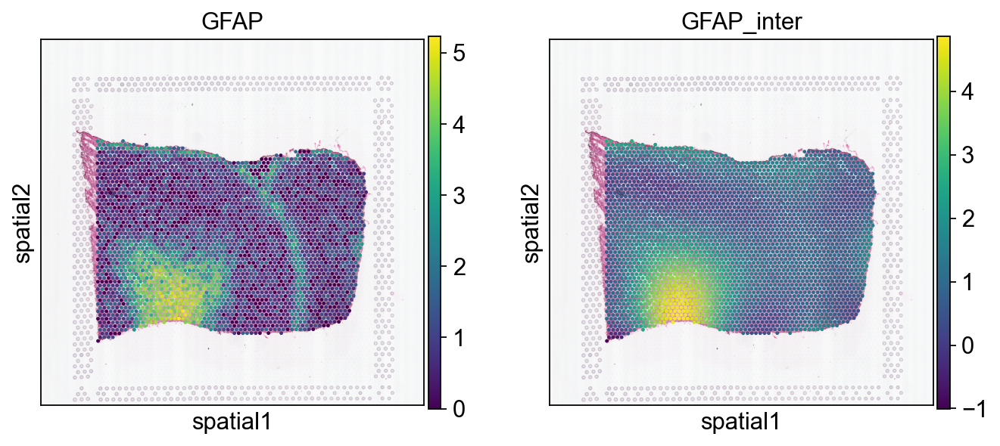

In [10]:
gene_inter = inter(x=rotate_coord[:, 0], y=rotate_coord[:, 1], grid=False)
adata_sp.obs['GFAP_inter'] = gene_inter
sq.pl.spatial_scatter(adata_sp,
                        color=['GFAP', 'GFAP_inter'],
                        library_key='sample_id', ncols=5, img=True, size=1.3)

In [11]:
coord_df.sort_values(['y', 'x'])

,x,y
GTCATCTCCTACAGCT-1,3861,4774
CGTCCAGATGGCTCCA-1,2659,4777
GATAGCGTACCACGCG-1,2860,4777
TCTCGGCTCCAGGACT-1,4963,4946
GAAATGGGATGTAAAC-1,4362,4947
...,...,...
GGGATGGACCCGCGTC-1,3184,14010
GGGCAGGATTTCTGTG-1,3384,14010
TCCAATGCGTCGCCGC-1,2784,14011
CCTATTATTCCGGCCG-1,2984,14011


In [12]:
from sklearn.neighbors import radius_neighbors_graph

In [13]:
np.sqrt(2) * 200

282.842712474619

In [14]:



unique, counts = np.unique(pdist(coord_df.values), return_counts=True)
dict(zip(unique, counts))

{199.82242116439286: 47,
 200.0: 1020,
 200.0024999843752: 1123,
 200.19240744843447: 481,
 200.32473636573192: 60,
 200.6888138387389: 2142,
 201.0: 353,
 201.0024875467963: 398,
 201.06217943710845: 455,
 201.1889659002203: 1621,
 201.55644370746373: 950,
 346.30766667805665: 244,
 346.4476872487389: 182,
 346.8083043988422: 195,
 346.95388742598055: 3,
 347.17430780517157: 1348,
 347.3110997362451: 2611,
 347.67369759589235: 1044,
 347.81604333325396: 34,
 348.0: 135,
 348.0014367786432: 1423,
 349.0: 113,
 349.0014326618159: 1163,
 400.0012499980469: 1291,
 400.0049999687504: 73,
 400.88028138086315: 42,
 401.00124688085447: 1402,
 401.00498750015566: 69,
 401.01122178811903: 173,
 401.3776276774778: 27,
 401.5133870744536: 35,
 401.7486776580603: 1782,
 401.8768468075761: 2143,
 402.2449502479801: 947,
 402.3779318004406: 443,
 529.7027468307107: 217,
 529.7405025104273: 1041,
 530.0283011311755: 2275,
 530.0716932642225: 1201,
 530.0962176812809: 538,
 530.292372187268: 939,
 530

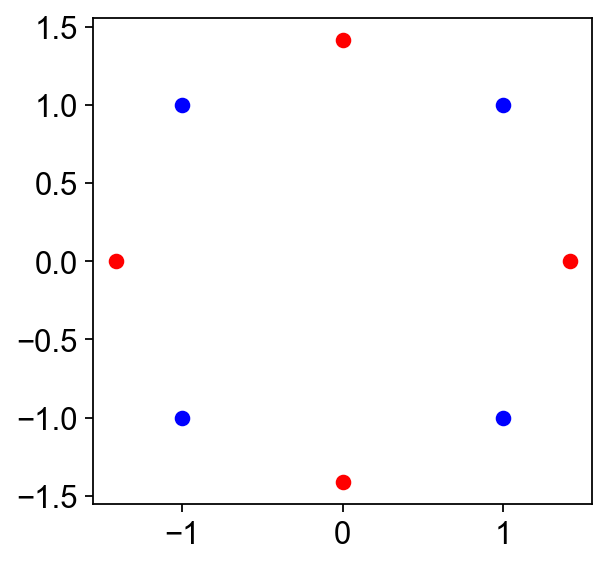

In [15]:
X = np.array([[1, 1], [-1, 1], [-1, -1], [1, -1]])
A = 1 / np.sqrt(2) * np.array([[1, -1], [1, 1]])
X_new = X @ A
plt.plot(X[:, 0], X[:, 1], 'bo')
plt.plot(X_new[:, 0], X_new[:, 1], 'ro')
plt.grid()

In [16]:
x_max, y_max = coord_df.max(axis=0).to_list()
x_min, y_min = coord_df.min(axis=0).to_list()

x_center = x_min + (x_max - x_min) / 2
y_center = y_min + (y_max - y_min) / 2

In [17]:
x_center, y_center

(8970.5, 9480.0)

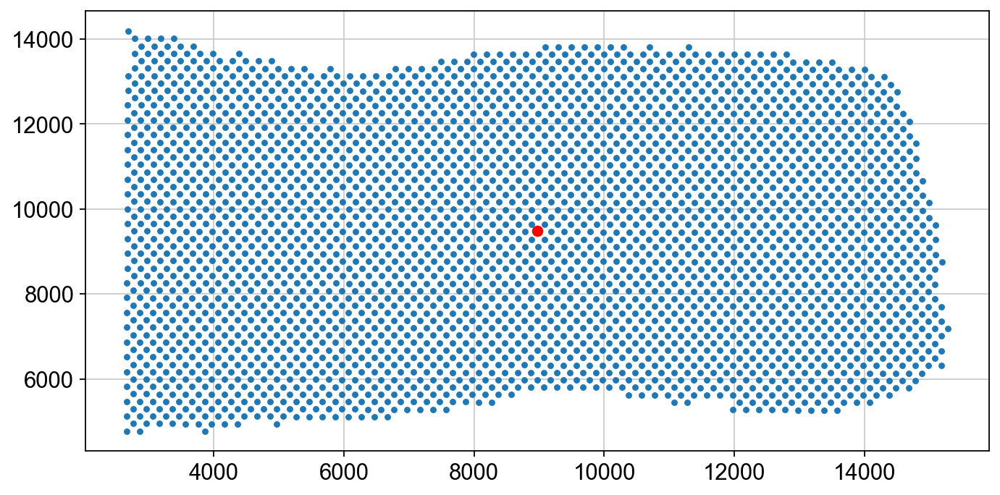

In [18]:
plt.figure(figsize=(10, 5))
plt.plot(coord_df['x'], coord_df['y'], '.')

plt.plot(x_center, y_center, 'ro')

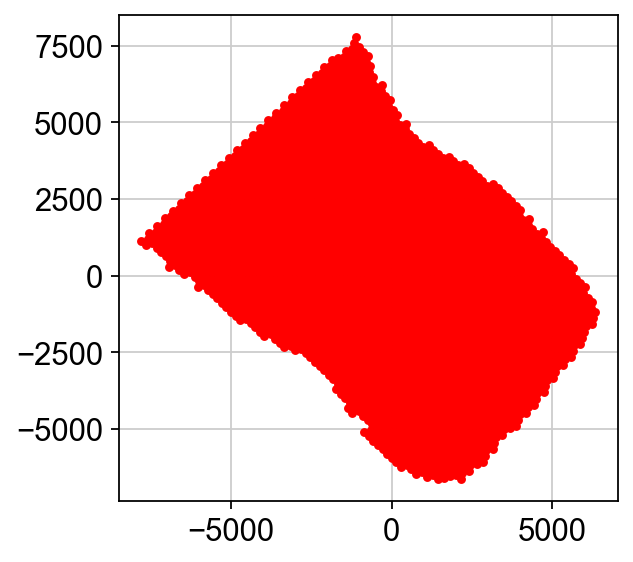

In [19]:
centered_coord = coord_df.values - np.array([x_center, y_center])
rotate_coord = centered_coord @ A
plt.plot(rotate_coord[:, 0], rotate_coord[:, 1], 'r.')

In [20]:
dev = np.floor_divide(rotate_coord, 200)
x_max, y_max = dev.max(axis=0)
x_min, y_min = dev.min(axis=0)

In [21]:
x_min, y_min

(-39.0, -34.0)

In [22]:
dev

array([[-39.,   5.],
       [-38.,   6.],
       [-37.,   8.],
       ...,
       [ 15., -29.],
       [ 19., -25.],
       [ 14., -31.]])

In [23]:
real_coord = dev - np.array([x_min, y_min])
real_coord

array([[ 0., 39.],
       [ 1., 40.],
       [ 2., 42.],
       ...,
       [54.,  5.],
       [58.,  9.],
       [53.,  3.]])

In [24]:
x = np.arange(0, x_max - x_min + 1)
y = np.arange(0, y_max - y_min + 1)

In [25]:
dev.max(axis=0)

array([31., 38.])

In [26]:
coord = np.array(np.meshgrid(x, y)).T.reshape(-1, 2)
df = pd.DataFrame(coord, columns=['x', 'y']).set_index(['x', 'y'])
df['values'] = 0
df.head()

values
x   y          
0.0 0.0       0
    1.0       0
    2.0       0
    3.0       0
    4.0       0

In [27]:
from scipy.signal import medfilt2d, wiener

df.loc[real_coord.tolist()] = gene_expr.reshape(-1, 1)
X = df.reset_index().pivot(index='x', columns='y', values='values').values
X_filt = medfilt2d(X, kernel_size=3)
X_filt_w = wiener(X)

c:\projects\spatialMPFC\venv\Lib\site-packages\scipy\signal\_signaltools.py:1659: RuntimeWarning: divide by zero encountered in divide
  res *= (1 - noise / lVar)
c:\projects\spatialMPFC\venv\Lib\site-packages\scipy\signal\_signaltools.py:1659: RuntimeWarning: invalid value encountered in multiply
  res *= (1 - noise / lVar)


<Axes: >

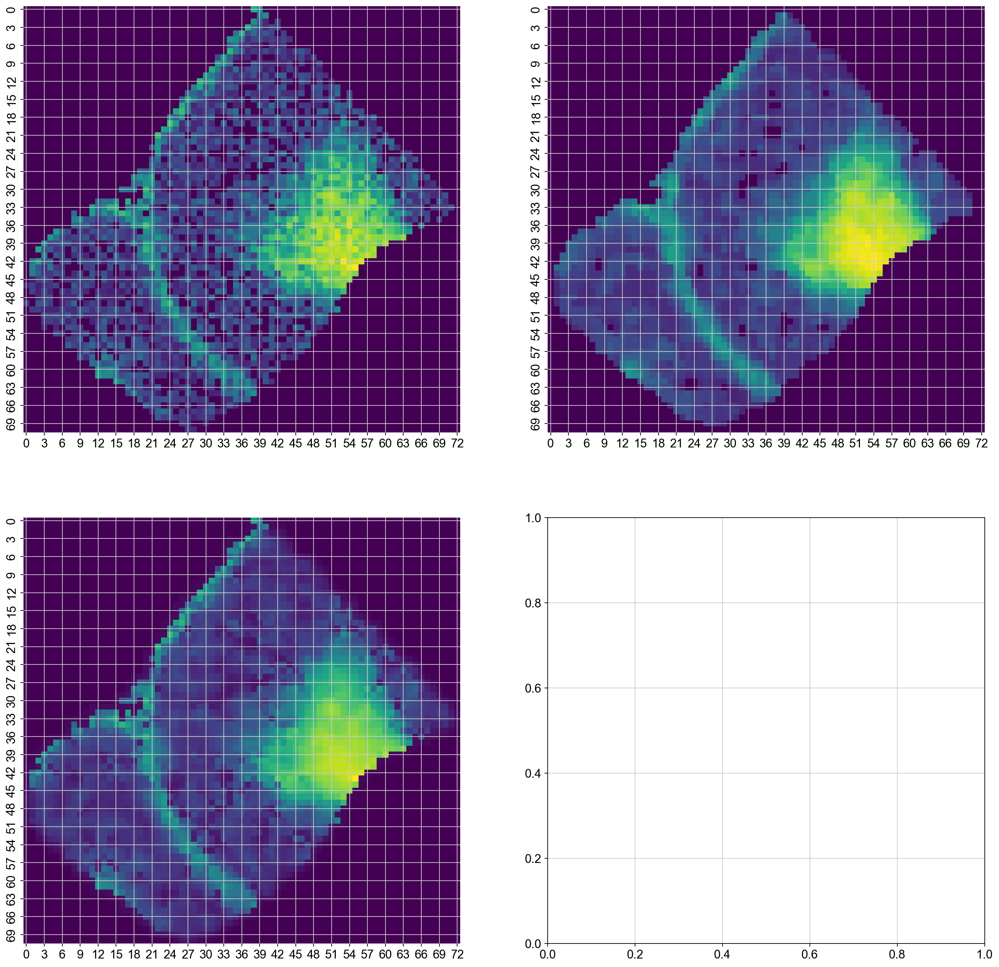

In [28]:
fig, axes = plt.subplots(2, 2, figsize=(20, 20))
sns.heatmap(X, ax=axes[0, 0], cbar=False, cmap='viridis')
sns.heatmap(X_filt, ax=axes[0, 1], cbar=False, cmap='viridis')
sns.heatmap(X_filt_w, ax=axes[1, 0], cbar=False, cmap='viridis')

In [34]:
expr_filt = pd.DataFrame(X_filt).T.unstack().loc[real_coord.tolist()]

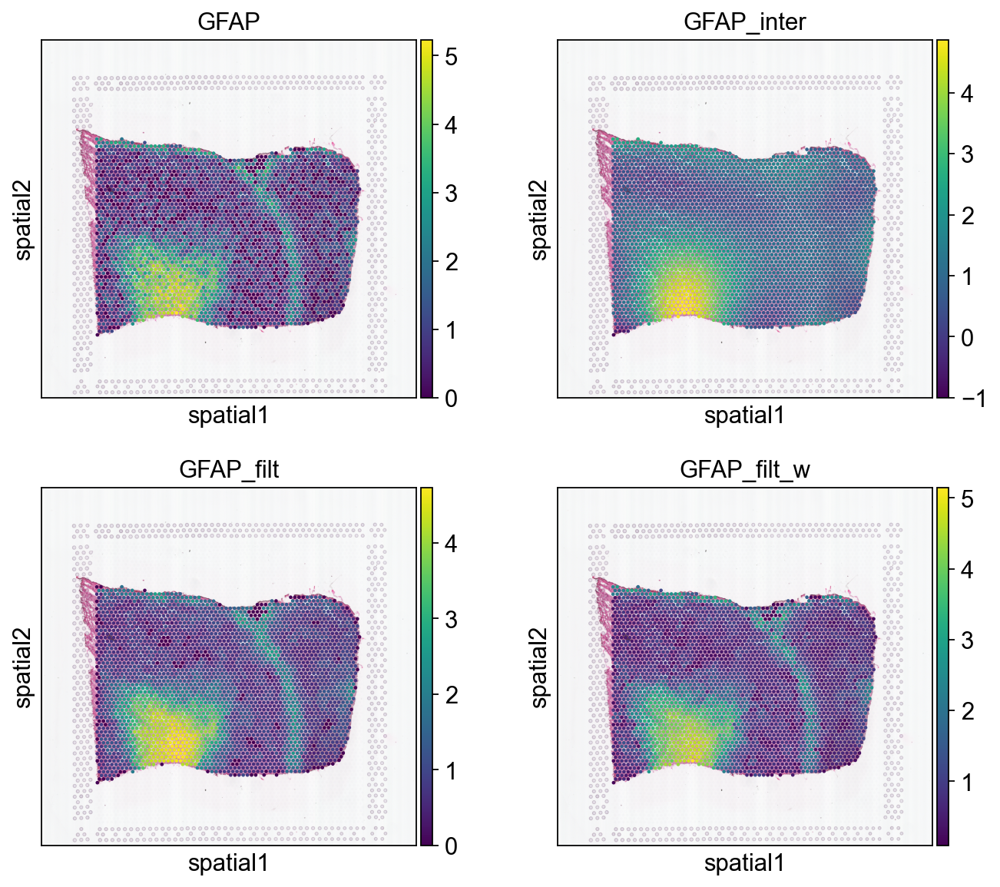

In [38]:
gene_inter = inter(x=rotate_coord[:, 0], y=rotate_coord[:, 1], grid=False)
adata_sp.obs['GFAP_inter'] = gene_inter
adata_sp.obs['GFAP_filt'] = pd.DataFrame(X_filt).T.unstack().loc[real_coord.tolist()].values
adata_sp.obs['GFAP_filt_w'] = pd.DataFrame(X_filt_w).T.unstack().loc[real_coord.tolist()].values
sq.pl.spatial_scatter(adata_sp,
                        color=['GFAP', 'GFAP_inter', 'GFAP_filt', 'GFAP_filt_w'],
                        library_key='sample_id', ncols=2, img=True, size=1.3)